# GLITCH DETECTOR

# Introduction
This is the main notebook of the project, analyzing a full vocal track waveform to detect glitches

# Problem statement
The primary goal is to detect anomalies (glitches) in audio signals, which are rare and have no consistent pattern.

# Challenge
Since glitches are uncommon and vary in nature, supervised approaches are challenging due to limited labeled data. Therefore, I opted for unsupervised methods.

# Algorithms chosen
Isolation Forest is inherently designed for anomaly detection. It isolates data points by creating decision trees and identifies outliers as those requiring fewer splits. It works well with high-dimensional data and is computationally efficient.

Autoencoders are neural networks designed to reconstruct inputs. They learn the "normal" patterns in the data. High reconstruction errors indicate anomalies. They are flexible and can handle complex, nonlinear relationships in data.

# Workflow Phases and Outputs

1. **WAV to DataFrame**  
   - **Output**: Loaded audio signal, sampling rate, time array, and initial DataFrame representation of the audio signal.

2. **Generic Visualization**  
   - **Output**: Visualized waveform and standard spectrogram.

3. **Feature Extraction**  
   - **Output**: Extracted audio features including MFCCs, Chroma features, Pitch (F0), and Low-Frequency Pitch Confidence.

4. **Feature Integration**  
   - **Output**: Combined DataFrame containing all features aligned with time.

5. **Machine Learning Analysis**
   - **5.1 Isolation Forest**  
     - **Output**: Anomaly scores and detected anomalies using Isolation Forest.
   - **5.2 Isolation Forest Anomaly Visualization**  
     - **Output**: Waveform and spectrogram plots highlighting anomalies detected by Isolation Forest.
   - **5.3 Autoencoders**  
     - **Output**: Anomaly scores and detected anomalies using Autoencoders.
   - **5.4 Autoencoders Anomaly Visualization**  
     - **Output**: Waveform and spectrogram plots highlighting anomalies detected by Autoencoders.

6. **Comparative Analysis of Anomalies**  
   - **Output**: Comparison of anomalies detected by Isolation Forest and Autoencoders:
     - Overlapping anomalies.
     - Unique anomalies from each algorithm.
     - Insights into algorithm performance.

# 1. WAV to DataFrame

In [ ]:
!git clone https://github.com/mwtuni/glitches-in-christmas.git temp
!mv temp/data .

# Import necessary libraries
import pandas as pd
import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt
import soundfile as sf
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Import necessary libraries
import pandas as pd
import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt
import soundfile as sf
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Load the audio file
file_path = 'data/2-Away_in_a_Manger_-_mwtuni_vocal.wav'  # Path to WAV file
signal, sr = librosa.load(file_path, sr=None)  # Keep the original sampling rate

# Print basic information about the audio file
print(f"Sampling rate: {sr} Hz")
print(f"Audio duration: {len(signal)/sr:.2f} seconds")

# Create a time array corresponding to each sample
time = np.linspace(0, len(signal) / sr, len(signal))

# Convert to DataFrame
audio_df = pd.DataFrame({'Time (s)': time, 'Amplitude': signal})


Sampling rate: 40000 Hz
Audio duration: 164.04 seconds


# 2. Generic Visualization

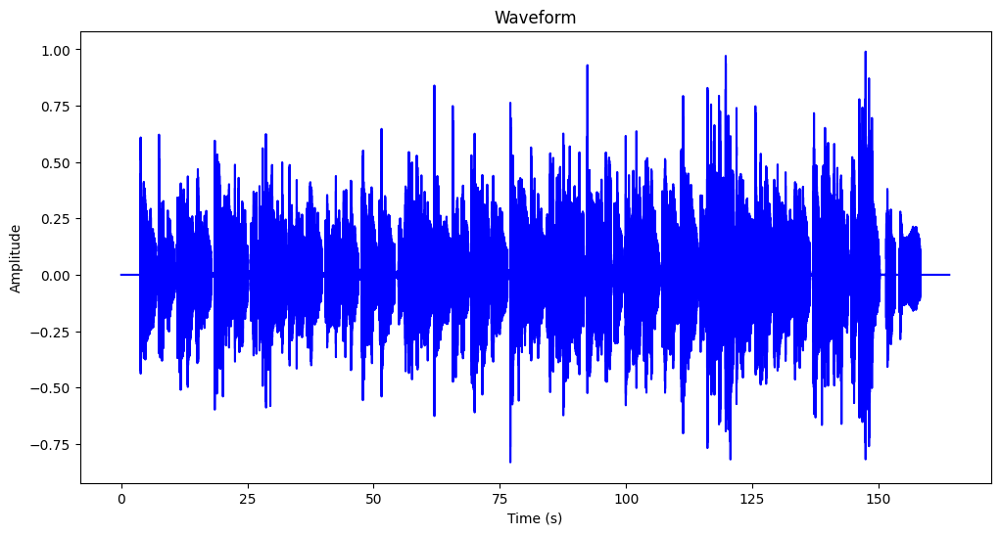

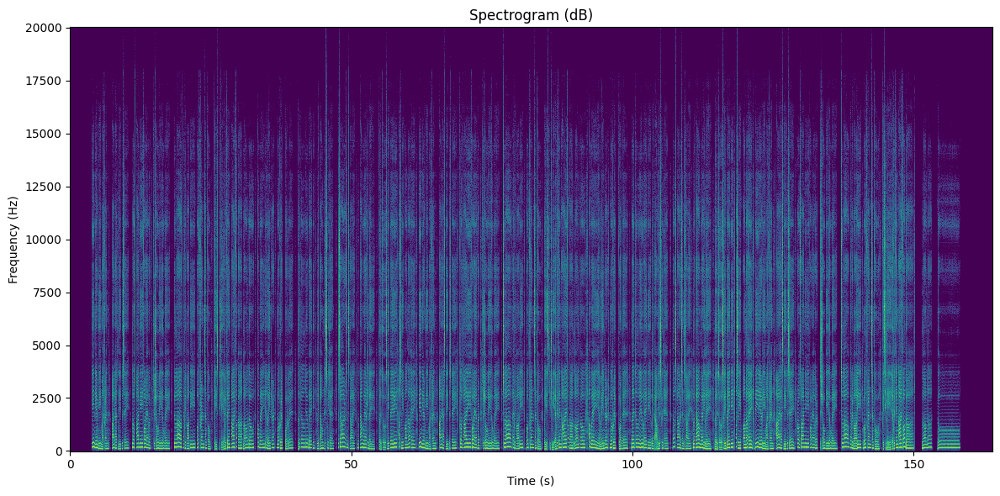

In [2]:
# Plot the waveform showing how loud a sound is at each moment in time
plt.figure(figsize=(12, 6))
plt.plot(audio_df['Time (s)'], audio_df['Amplitude'], color='blue')
plt.title('Waveform')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.show()

# Plot the spectrogram showing how energy is distributed across frequencies
plt.figure(figsize=(12, 6))
S = librosa.stft(signal)  # Short-Time Fourier Transform
S_db = librosa.amplitude_to_db(abs(S), ref=np.max)  # Convert to decibels
spec = librosa.display.specshow(S_db, sr=sr, x_axis='s', y_axis='hz', cmap='viridis')  # Use 's' for seconds

# Add titles and labels (removed colorbar to match layout with waveform)
plt.title('Spectrogram (dB)')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.tight_layout()  # Ensures layout consistency
plt.show()


# 3. Feature Extraction

## 3.1 Mel-Frequency Cepstral Coefficients (MFCCs)
*- Represent the timbre and frequency structure of the audio*\
*- Useful for identifying changes in tonal characteristics or unnatural shifts in frequency patterns*\
*- Sensitive to **sudden changes in voice pitch** (e.g., octave jumps) and **unexpected spectral shifts** caused by distortion*


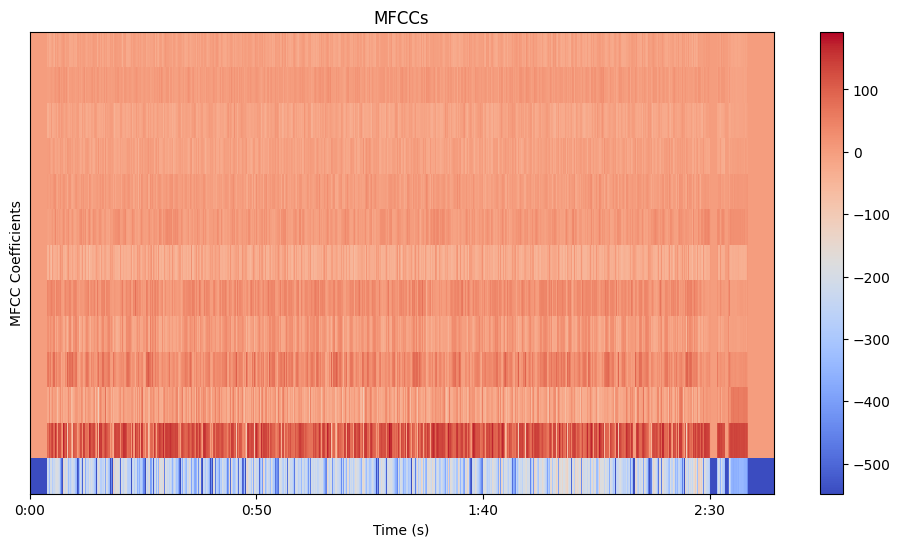

In [3]:
# Extract MFCCs
mfccs = librosa.feature.mfcc(y=signal, sr=sr, n_mfcc=13)

# Convert MFCCs to a DataFrame for inspection
mfcc_df = pd.DataFrame(mfccs.T, columns=[f'MFCC{i+1}' for i in range(mfccs.shape[0])])

# Display the first few rows of MFCCs
mfcc_df.head()

# Visualize MFCCs
plt.figure(figsize=(12, 6))
librosa.display.specshow(mfccs, x_axis='time', sr=sr, cmap='coolwarm')
plt.colorbar()
plt.title('MFCCs')
plt.xlabel('Time (s)')
plt.ylabel('MFCC Coefficients')
plt.show()

## 3.2 Chroma Features
*- Represent pitch class energy (e.g., how much energy is present in specific musical notes like C, D, E, etc.)*\
*- Useful for detecting abrupt changes in pitch and anomalies in harmonic consistency caused by artifacts in voice modeling*

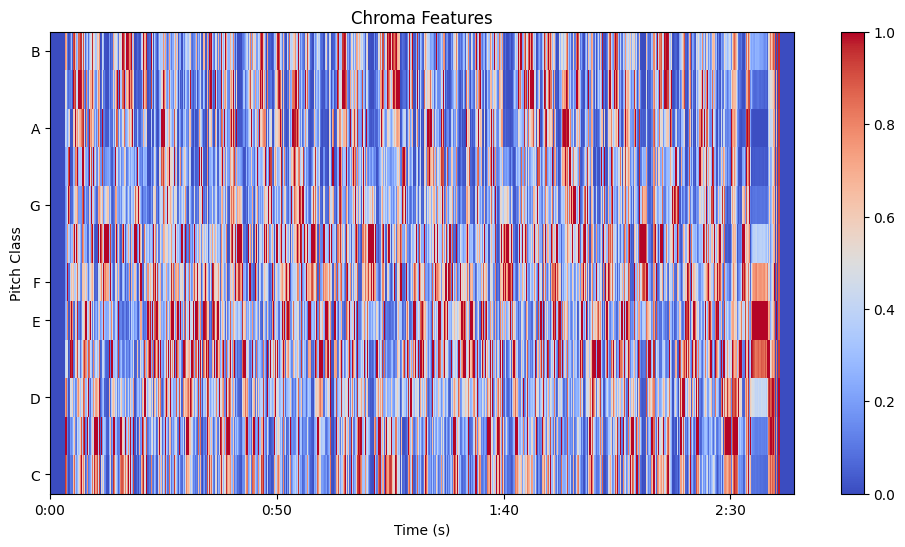

In [4]:
# Extract chroma features
chroma = librosa.feature.chroma_stft(y=signal, sr=sr)

# Convert to DataFrame
chroma_df = pd.DataFrame(chroma.T, columns=[f'Chroma{i+1}' for i in range(chroma.shape[0])])

# Display the first few rows of Chroma features
chroma_df.head()

# Visualize chroma features
plt.figure(figsize=(12, 6))
librosa.display.specshow(chroma, x_axis='time', y_axis='chroma', cmap='coolwarm', sr=sr)
plt.colorbar()
plt.title('Chroma Features')
plt.xlabel('Time (s)')
plt.ylabel('Pitch Class')
plt.show()

# 3.3 Pitch (F0)

C:\Users\Mika\AppData\Local\Temp\ipykernel_7132\875856868.py:23: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  interpolated_f0 = pd.Series(interpolated_f0).fillna(method='ffill').fillna(method='bfill').values


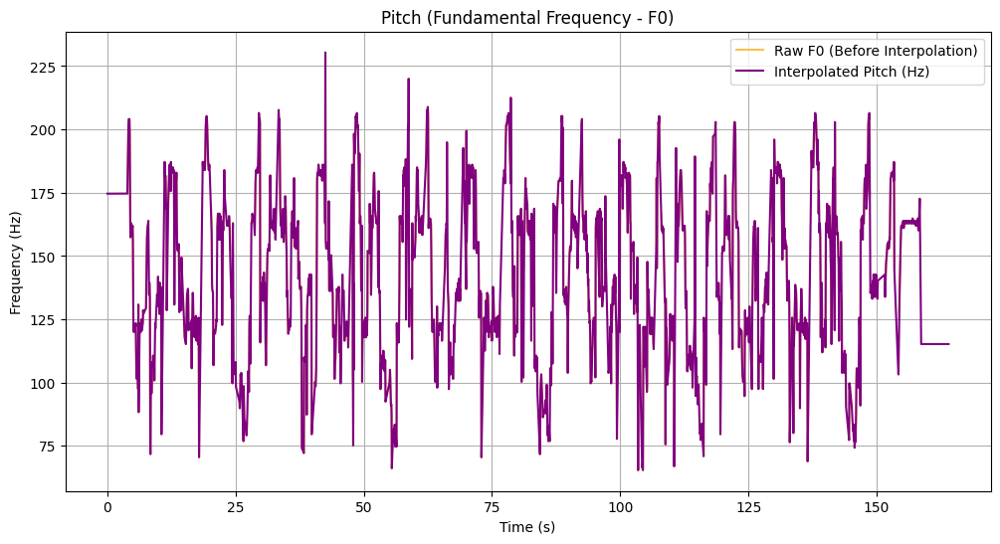

In [5]:
# Extract pitch (F0) using librosa's pyin
f0, voiced_flag, voiced_prob = librosa.pyin(
    signal, 
    fmin=librosa.note_to_hz('C2'), 
    fmax=librosa.note_to_hz('C7'), 
    sr=sr, 
    hop_length=2048  # Use a larger hop length for faster processing
)

# Create a time array for the raw `f0` values
f0_times = np.linspace(0, len(signal) / sr, len(f0))

# Interpolate `f0` to match the high-resolution time index in `audio_df`
# Skip NaNs during interpolation by first masking them
valid_indices = ~np.isnan(f0)
interpolated_f0 = np.interp(
    audio_df['Time (s)'],        # Target times
    f0_times[valid_indices],     # Times with valid `f0` values
    f0[valid_indices]            # Valid `f0` values
)

# Handle remaining gaps by forward filling and backward filling
interpolated_f0 = pd.Series(interpolated_f0).fillna(method='ffill').fillna(method='bfill').values

# Add the interpolated pitch to the audio DataFrame
audio_df['Pitch (Hz)'] = interpolated_f0

# Visualize raw F0 and interpolated F0
plt.figure(figsize=(12, 6))

# Plot raw F0 for debugging
plt.plot(f0_times, f0, label='Raw F0 (Before Interpolation)', color='orange', alpha=0.7)

# Plot interpolated F0
plt.plot(audio_df['Time (s)'], audio_df['Pitch (Hz)'], label='Interpolated Pitch (Hz)', color='purple')

plt.title('Pitch (Fundamental Frequency - F0)')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.legend()
plt.grid()
plt.show()


# 3.4 Low-Frequency Pitch Confidence
Analyze pitch confidence in sections where pitch (F0) is under 75 Hz. If there is no significant pitch confidence\
in these sections, they are considered as anomalies.

C:\Users\Mika\AppData\Local\Temp\ipykernel_7132\1600407538.py:27: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[0.97907459 0.97950472 0.97993484 ... 0.96988943 0.96985133 0.96981323]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  audio_df.loc[low_pitch_mask, 'Low-Pitch Anomaly Score'] = low_pitch_anomaly_scores


Percentage of low-pitch regions flagged as anomalies: 100.00%


C:\Users\Mika\AppData\Roaming\Python\Python311\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


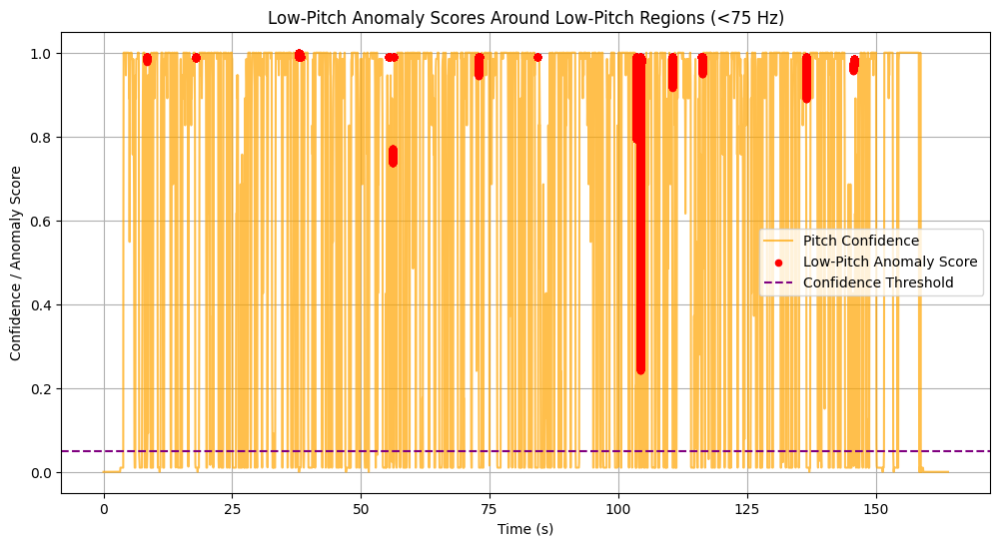

In [6]:
# %% [markdown]
# ## 2.4 Low-Frequency Pitch Confidence
# Analyze pitch confidence in sections where pitch (F0) is under 75 Hz. If there is no significant pitch confidence
# in these sections, they are considered as anomalies.

# Define pitch threshold and confidence threshold
low_pitch_threshold = 75  # Hz
confidence_threshold = 0.05  # Minimum confidence to consider a valid pitch

# Interpolate `voiced_prob` to match the resolution of `audio_df`
interpolated_confidence = np.interp(
    audio_df['Time (s)'],  # Target times
    f0_times[~np.isnan(voiced_prob)],  # Times with valid voiced_prob values
    voiced_prob[~np.isnan(voiced_prob)]  # Corresponding valid voiced_prob values
)

# Identify sections with low pitch (< 75 Hz)
low_pitch_mask = interpolated_f0 < low_pitch_threshold

# Extract pitch confidence for low-pitch regions
low_pitch_confidence = np.where(low_pitch_mask, interpolated_confidence, np.nan)  # Use NaN for non-low-pitch regions

# Transform Low-Pitch Anomaly feature into a continuous score
# Use `1 - confidence` for low-pitch regions, 0 for others
audio_df['Low-Pitch Anomaly Score'] = 0  # Default to 0
low_pitch_anomaly_scores = 1 - low_pitch_confidence[~np.isnan(low_pitch_confidence)]  # Higher score for lower confidence
audio_df.loc[low_pitch_mask, 'Low-Pitch Anomaly Score'] = low_pitch_anomaly_scores

# Apply a weight to the Low-Pitch Anomaly Score
#weight_factor = 5  # Weight this feature more heavily than others
#audio_df['Low-Pitch Anomaly Score'] *= weight_factor

# Clip the scores to ensure they stay between 0 and 1 (optional but recommended)
audio_df['Low-Pitch Anomaly Score'] = audio_df['Low-Pitch Anomaly Score'].clip(lower=0, upper=1)

# Display the percentage of time considered anomalous in low-pitch regions
low_pitch_anomalous_ratio = (audio_df['Low-Pitch Anomaly Score'] > 0).sum() / low_pitch_mask.sum()
print(f"Percentage of low-pitch regions flagged as anomalies: {low_pitch_anomalous_ratio:.2%}")

# Plot low-pitch confidence for visualization
plt.figure(figsize=(12, 6))

# Plot interpolated confidence
plt.plot(audio_df['Time (s)'], interpolated_confidence, label='Pitch Confidence', color='orange', alpha=0.7)

# Highlight low-pitch anomaly scores
plt.scatter(
    audio_df['Time (s)'][audio_df['Low-Pitch Anomaly Score'] > 0],
    audio_df['Low-Pitch Anomaly Score'][audio_df['Low-Pitch Anomaly Score'] > 0],
    color='red', label='Low-Pitch Anomaly Score', s=20, zorder=5
)

# Plot threshold line
plt.axhline(confidence_threshold, color='purple', linestyle='--', label='Confidence Threshold')

# Finalize the plot
plt.title('Low-Pitch Anomaly Scores Around Low-Pitch Regions (<75 Hz)')
plt.xlabel('Time (s)')
plt.ylabel('Confidence / Anomaly Score')
plt.legend()
plt.grid()
plt.show()



## 4 Feature Integration

In [7]:
# Generate a frame-wise time array for MFCCs, chroma, and pitch features
mfcc_frame_times = np.linspace(0, len(signal) / sr, mfccs.shape[1])
chroma_frame_times = np.linspace(0, len(signal) / sr, chroma.shape[1])
pitch_frame_times = np.linspace(0, len(signal) / sr, len(f0))  # Match the resolution of pitch extraction

# Interpolate MFCCs to match `Time (s)`
resampled_mfccs = np.array([np.interp(audio_df['Time (s)'], mfcc_frame_times, mfccs[i]) for i in range(mfccs.shape[0])])

# Interpolate Chroma features to match `Time (s)`
resampled_chroma = np.array([np.interp(audio_df['Time (s)'], chroma_frame_times, chroma[i]) for i in range(chroma.shape[0])])

# Interpolate Pitch (Hz) to match `Time (s)`
resampled_pitch = np.interp(
    audio_df['Time (s)'],  # Target time axis
    pitch_frame_times,     # Source time axis
    np.nan_to_num(f0, nan=0)  # Replace NaN for interpolation (will fix later)
)

# Replace remaining 0 or NaN values in resampled pitch with forward/backward filling
resampled_pitch = pd.Series(resampled_pitch).replace(0, np.nan).fillna(method='ffill').fillna(method='bfill').values

# Convert resampled features to DataFrames
resampled_mfccs_df = pd.DataFrame(resampled_mfccs.T, columns=[f'MFCC{i+1}' for i in range(mfccs.shape[0])])
resampled_chroma_df = pd.DataFrame(resampled_chroma.T, columns=[f'Chroma{i+1}' for i in range(chroma.shape[0])])
resampled_pitch_df = pd.DataFrame({'Pitch (Hz)': resampled_pitch})

# Resample the Low-Frequency Pitch Confidence anomaly score to match `Time (s)`
resampled_low_pitch_anomalies = np.interp(
    audio_df['Time (s)'],  # Target time axis
    audio_df['Time (s)'],  # Source time axis (already aligned with `Low-Pitch Anomaly Score`)
    audio_df['Low-Pitch Anomaly Score']  # Anomaly scores to resample
)

# Convert resampled Low-Pitch Anomaly Score to a DataFrame
resampled_low_pitch_anomalies_df = pd.DataFrame({'Low-Pitch Anomaly Score': resampled_low_pitch_anomalies})

# Combine all features into a single DataFrame
combined_features_df = pd.concat([
    audio_df['Time (s)'],
    resampled_mfccs_df,
    resampled_chroma_df,
    resampled_pitch_df,
    resampled_low_pitch_anomalies_df
], axis=1)

# Check the first few rows of the combined features
print(combined_features_df.head())

# Verify that there are no NaN values in the combined DataFrame
print(combined_features_df.isna().sum())


C:\Users\Mika\AppData\Local\Temp\ipykernel_7132\194537016.py:20: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  resampled_pitch = pd.Series(resampled_pitch).replace(0, np.nan).fillna(method='ffill').fillna(method='bfill').values


   Time (s)       MFCC1  MFCC2  MFCC3  MFCC4  MFCC5  MFCC6  MFCC7  MFCC8  \
0  0.000000 -548.341125    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
1  0.000025 -548.341125    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
2  0.000050 -548.341125    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
3  0.000075 -548.341125    0.0    0.0    0.0    0.0    0.0    0.0    0.0   
4  0.000100 -548.341125    0.0    0.0    0.0    0.0    0.0    0.0    0.0   

   MFCC9  ...  Chroma5  Chroma6  Chroma7  Chroma8  Chroma9  Chroma10  \
0    0.0  ...      0.0      0.0      0.0      0.0      0.0       0.0   
1    0.0  ...      0.0      0.0      0.0      0.0      0.0       0.0   
2    0.0  ...      0.0      0.0      0.0      0.0      0.0       0.0   
3    0.0  ...      0.0      0.0      0.0      0.0      0.0       0.0   
4    0.0  ...      0.0      0.0      0.0      0.0      0.0       0.0   

   Chroma11  Chroma12  Pitch (Hz)  Low-Pitch Anomaly Score  
0       0.0       0.0    0.048087                

# 5 Machine Learning Analysis

This chapter does machine learning from the same input (Integrated Features). Anomalies are visualized and can be played for observation.

In [8]:
from IPython.display import Audio
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

def compute_metrics(ground_truth, predictions):
    """
    Compute standard performance metrics: Precision, Recall, F1 Score, and Accuracy.
    
    Args:
        ground_truth (array-like): Binary ground truth labels (1 for anomaly, 0 for normal).
        predictions (array-like): Binary predicted labels (1 for anomaly, 0 for normal).
        
    Returns:
        dict: Dictionary of computed metrics.
    """
    precision = precision_score(ground_truth, predictions)
    recall = recall_score(ground_truth, predictions)
    f1 = f1_score(ground_truth, predictions)
    accuracy = accuracy_score(ground_truth, predictions)
    return {
        "Precision": precision,
        "Recall": recall,
        "F1 Score": f1,
        "Accuracy": accuracy
    }

# Known glitch region
KNOWN_GLITCH = (103.889, 104.545)

# Helper function: Play an audio segment
def play_audio_segment(start_time, end_time, signal, sr):
    start_sample = int(start_time * sr)
    end_sample = int(end_time * sr)
    return Audio(signal[start_sample:end_sample], rate=sr)

# Helper function: Plot all anomalies on the waveform
def plot_anomaly_zoom_with_heatmap(start_time, end_time, anomaly_times, audio_df, features_df):
    """
    Plots the zoomed-in waveform, a heatmap of Chroma features (with piano keys), and MFCC features
    for the anomaly time range, highlighting multiple anomaly points.
    
    Args:
        start_time (float): Start time in seconds.
        end_time (float): End time in seconds.
        anomaly_times (list): List of anomaly times to highlight.
        audio_df (DataFrame): DataFrame containing the waveform data.
        features_df (DataFrame): DataFrame containing the features data.
    """
    # Filter data for the specified time range
    zoomed_audio = audio_df[(audio_df['Time (s)'] >= start_time) & (audio_df['Time (s)'] <= end_time)]
    zoomed_features = features_df[(features_df['Time (s)'] >= start_time) & (features_df['Time (s)'] <= end_time)]
    
    # Separate Chroma and MFCC features
    chroma_features = [col for col in features_df.columns if col.startswith('Chroma')]
    chroma_data = zoomed_features[chroma_features].values.T  # Transpose for heatmap
    time_axis = zoomed_features['Time (s)'].values

    # Plot waveform
    plt.figure(figsize=(14, 12))

    # Plot waveform with pitch overlay
    plt.subplot(3, 1, 1)
    plt.plot(zoomed_audio['Time (s)'], zoomed_audio['Amplitude'], color='blue', label='Waveform')

    # Overlay pitch information
    if 'Pitch (Hz)' in audio_df.columns:  # Check if pitch data exists
        pitch_data = audio_df[(audio_df['Time (s)'] >= start_time) & (audio_df['Time (s)'] <= end_time)]
        plt.plot(
            pitch_data['Time (s)'], 
            pitch_data['Pitch (Hz)'] / pitch_data['Pitch (Hz)'].max() * zoomed_audio['Amplitude'].max(), 
            color='orange', label='Pitch (Hz)', alpha=0.8  # Normalize pitch to match amplitude scale
        )

    # Highlight anomaly points
    for anomaly_time in anomaly_times:
        plt.axvline(anomaly_time, color='red', linestyle='--', linewidth=1.5, label='Anomaly Point' if anomaly_time == anomaly_times.iloc[0] else None)

    # Add titles, labels, and legend
    plt.title(f'Waveform and Pitch: Anomalies from {start_time:.2f}s to {end_time:.2f}s')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude / Pitch (Scaled)')
    plt.grid()
    plt.legend()

    # Plot Chroma features as a heatmap with piano keys
    plt.subplot(3, 1, 2)
    librosa.display.specshow(
        chroma_data,
        x_coords=time_axis,
        y_axis='chroma',  # Displays piano keys
        cmap='coolwarm'
    )
    for anomaly_time in anomaly_times:
        plt.axvline(anomaly_time, color='red', linestyle='--', linewidth=1.5)
    plt.title('Chroma Features (Piano Keys)')
    plt.xlabel('Time (s)')
    plt.ylabel('Pitch Class (Notes)')

    # Plot MFCC features
    plt.subplot(3, 1, 3)
    mfcc_features = [col for col in features_df.columns if col.startswith('MFCC')]
    for col in mfcc_features:
        plt.plot(zoomed_features['Time (s)'], zoomed_features[col], alpha=0.7, label=col)
    for anomaly_time in anomaly_times:
        plt.axvline(anomaly_time, color='red', linestyle='--', linewidth=1.5)
    plt.title('MFCC Features (Tonal Characteristics)')
    plt.xlabel('Time (s)')
    plt.ylabel('MFCC Value')
    plt.grid()
    plt.legend(loc='upper right')

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Helper function: Plot all anomalies on the waveform
def plot_waveform_with_all_anomalies(audio_df, anomalies, known_glitch, title="Waveform with Anomalies Highlighted"):
    plt.figure(figsize=(12, 6))
    plt.plot(audio_df['Time (s)'], audio_df['Amplitude'], color='blue', label='Waveform', alpha=0.6)

    # Highlight anomalies
    plt.scatter(anomalies['Time (s)'], [0] * len(anomalies), color='red', label='Anomalies', s=20, zorder=5)

    # Highlight the known glitch region
    if known_glitch:
        plt.axvspan(known_glitch[0], known_glitch[1], color='red', alpha=0.3, label='Known Glitch')

    plt.title(title)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid()
    plt.show()

# Helper function: Plot waveform with grouped anomalies highlighted
def plot_waveform_with_anomaly_groups(audio_df, grouped_anomalies, signal, sr, anomaly_duration=2):
    plt.figure(figsize=(12, 6))
    plt.plot(audio_df['Time (s)'], audio_df['Amplitude'], color='blue', label='Waveform', alpha=0.6)

    for anomaly_time in grouped_anomalies:
        start_time = max(0, anomaly_time - anomaly_duration)
        end_time = min(len(signal) / sr, anomaly_time + anomaly_duration)
        plt.axvspan(start_time, end_time, color='red', alpha=0.3, label='Anomaly Group' if anomaly_time == grouped_anomalies[0] else None)

    plt.title('Waveform with Anomaly Groups Highlighted')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.grid()
    plt.show()

# Helper function: Group anomalies by proximity
def group_anomalies(downsampled_df, time_column='Time (s)', anomaly_column='Anomaly', time_threshold=2):
    anomalies = downsampled_df[downsampled_df[anomaly_column]].sort_values(by=time_column)
    grouped_anomalies = []
    last_time = -float('inf')

    for _, row in anomalies.iterrows():
        anomaly_time = row[time_column]
        if anomaly_time - last_time >= time_threshold:
            grouped_anomalies.append(anomaly_time)
            last_time = anomaly_time

    return grouped_anomalies

# Helper function: Visualize grouped anomalies
def visualize_anomalies(signal, sr, audio_df, downsampled_df, grouped_anomalies, anomaly_duration=2):
    plot_waveform_with_anomaly_groups(audio_df, grouped_anomalies, signal, sr, anomaly_duration)

    for anomaly_time in grouped_anomalies:
        start_time = max(0, anomaly_time - anomaly_duration)
        end_time = min(len(signal) / sr, anomaly_time + anomaly_duration)

        print(f"Visualizing anomaly group around {anomaly_time:.2f}s (from {start_time:.2f}s to {end_time:.2f}s)...")
        display(play_audio_segment(start_time, end_time, signal, sr))

        anomalies_in_group = downsampled_df[
            (downsampled_df['Time (s)'] >= start_time) & 
            (downsampled_df['Time (s)'] <= end_time) & 
            (downsampled_df['Anomaly'])
        ]['Time (s)']

        plot_anomaly_zoom_with_heatmap(start_time, end_time, anomalies_in_group, audio_df, downsampled_df)


# 5.1 Isolation Forest

In [9]:
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Standardize features and apply Isolation Forest
scaler = StandardScaler()
scaled_features = scaler.fit_transform(combined_features_df.drop(['Time (s)'], axis=1).values)

isolation_forest = IsolationForest(
    contamination=0.0002,
    n_estimators=200,
    max_samples=256,
    random_state=42
)
anomaly_scores = isolation_forest.fit_predict(scaled_features)

# Add anomaly labels to DataFrame
downsampled_df = pd.DataFrame(scaled_features, columns=combined_features_df.columns.drop(['Time (s)']))
downsampled_df['Time (s)'] = combined_features_df['Time (s)']
downsampled_df['Anomaly'] = anomaly_scores == -1

# Count anomalies
total_anomalies = downsampled_df['Anomaly'].sum()
print(f"Total number of anomalies detected: {total_anomalies}")


Total number of anomalies detected: 1292


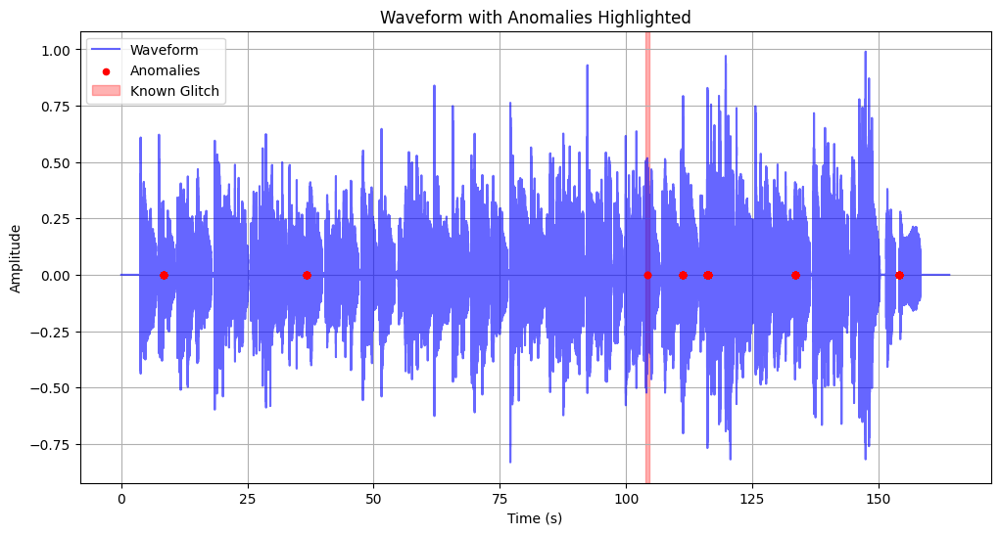

C:\Users\Mika\AppData\Roaming\Python\Python311\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


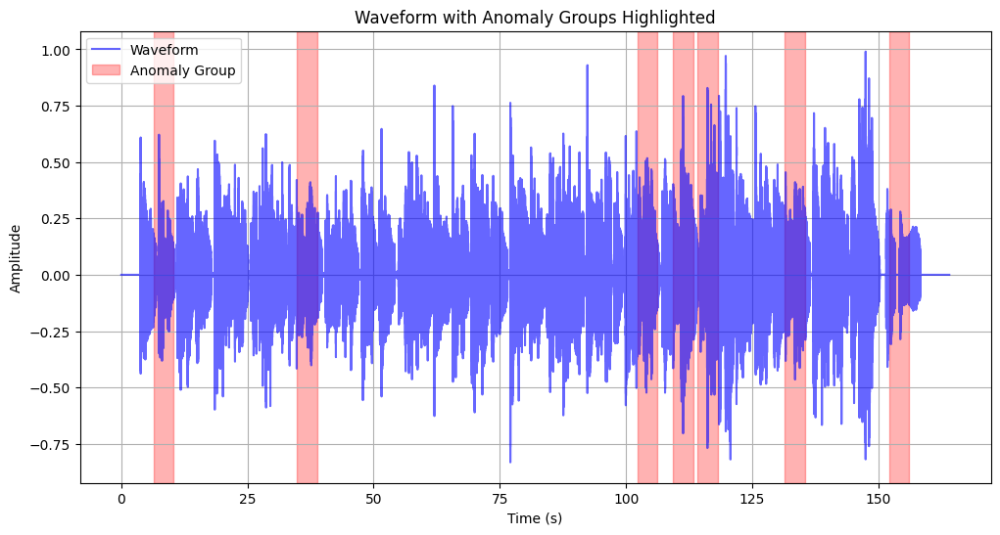

Visualizing anomaly group around 8.38s (from 6.38s to 10.38s)...


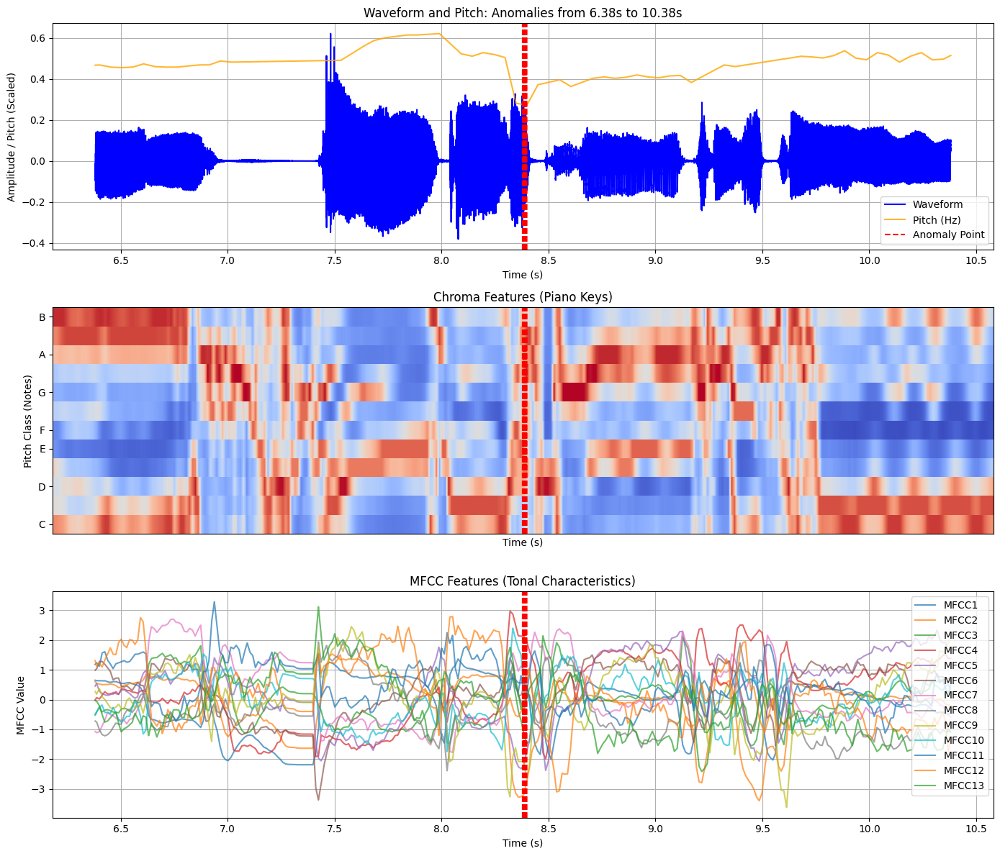

Visualizing anomaly group around 36.77s (from 34.77s to 38.77s)...


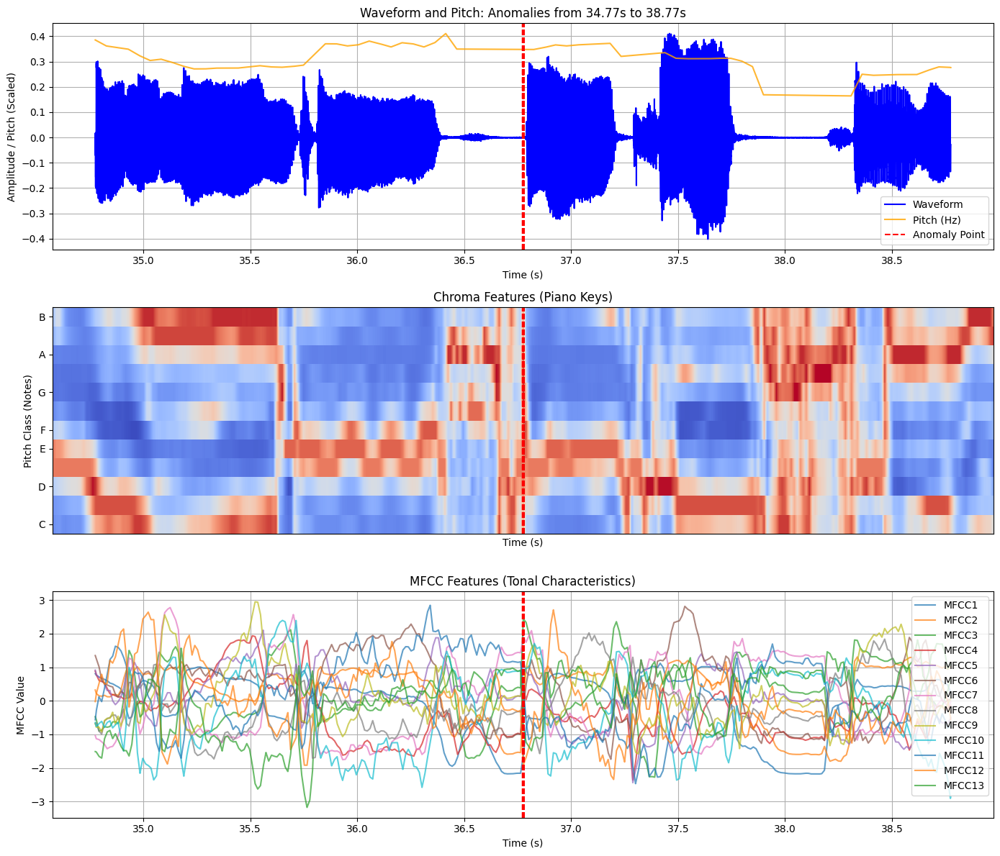

Visualizing anomaly group around 104.21s (from 102.21s to 106.21s)...


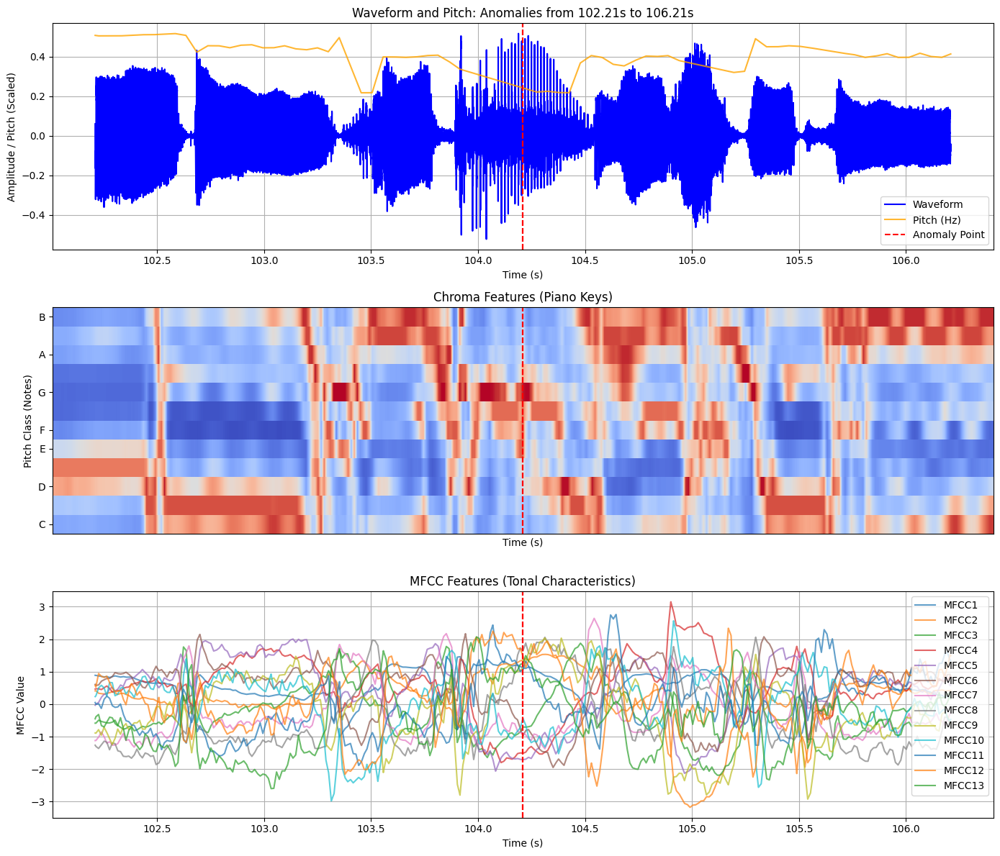

Visualizing anomaly group around 111.25s (from 109.25s to 113.25s)...


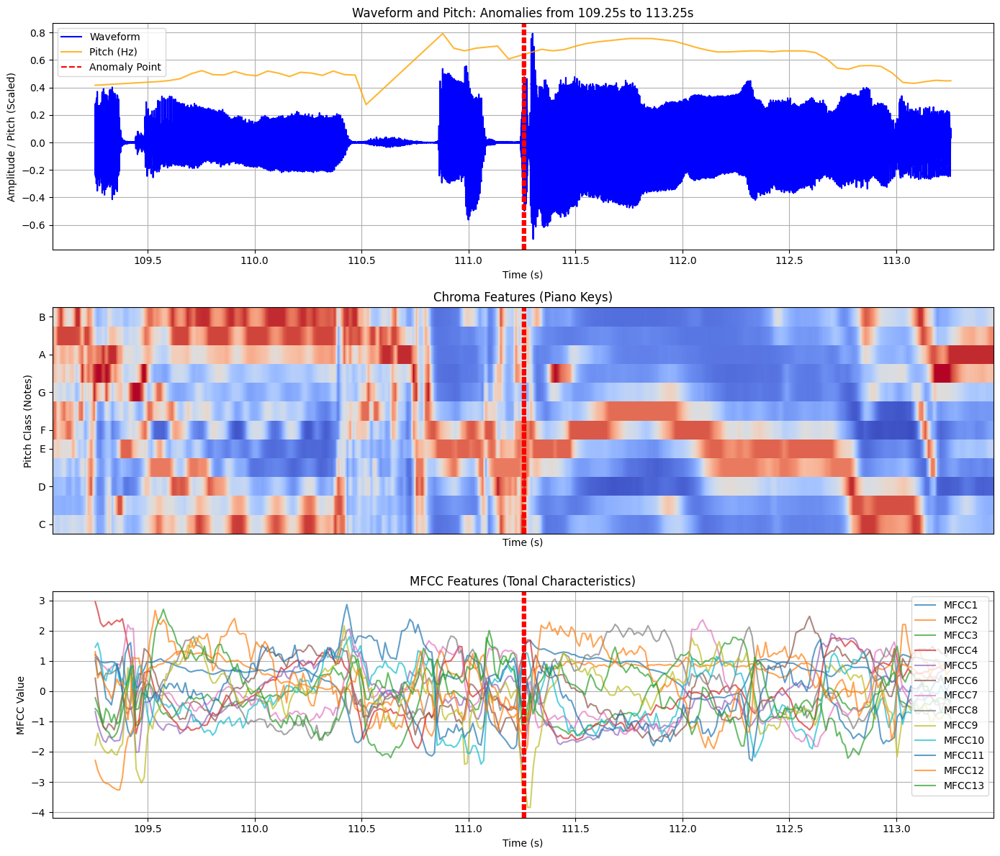

Visualizing anomaly group around 116.13s (from 114.13s to 118.13s)...


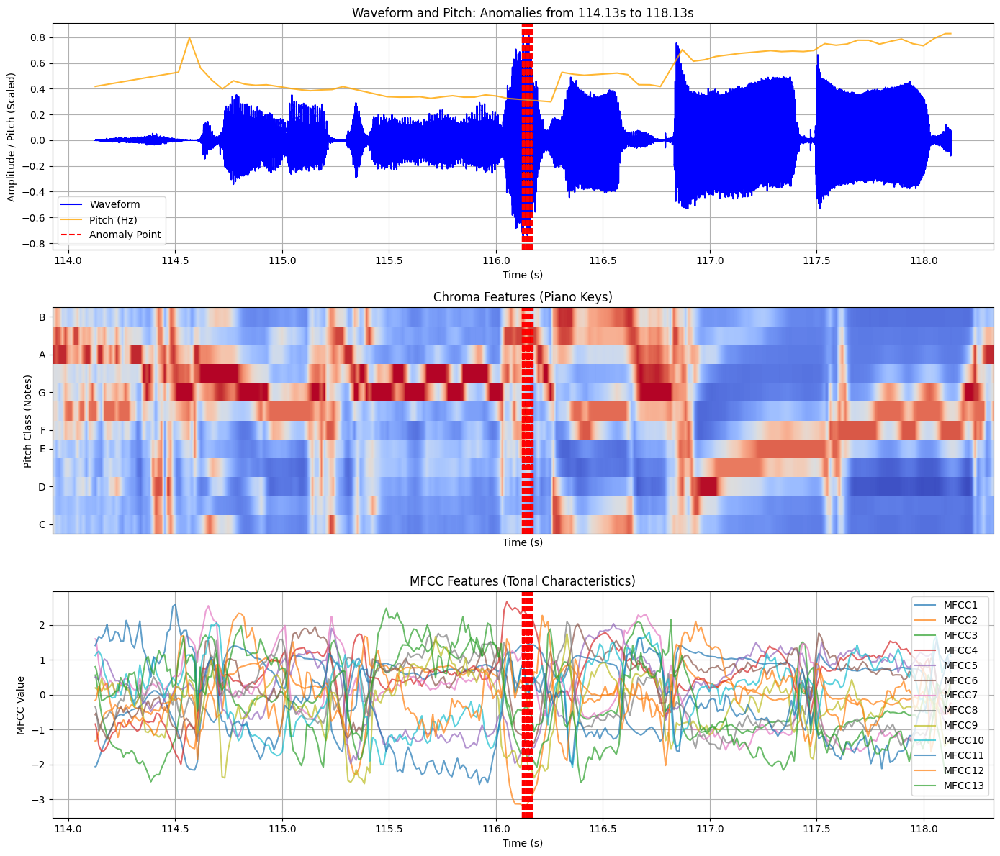

Visualizing anomaly group around 133.45s (from 131.45s to 135.45s)...


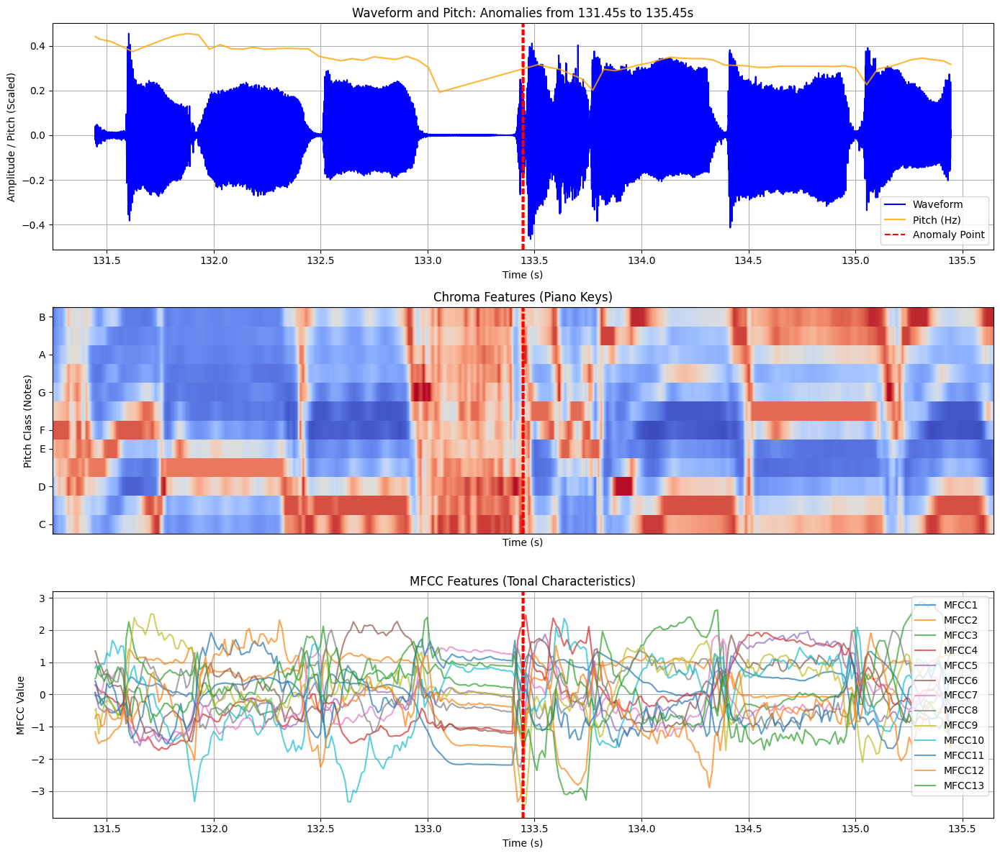

Visualizing anomaly group around 154.12s (from 152.12s to 156.12s)...


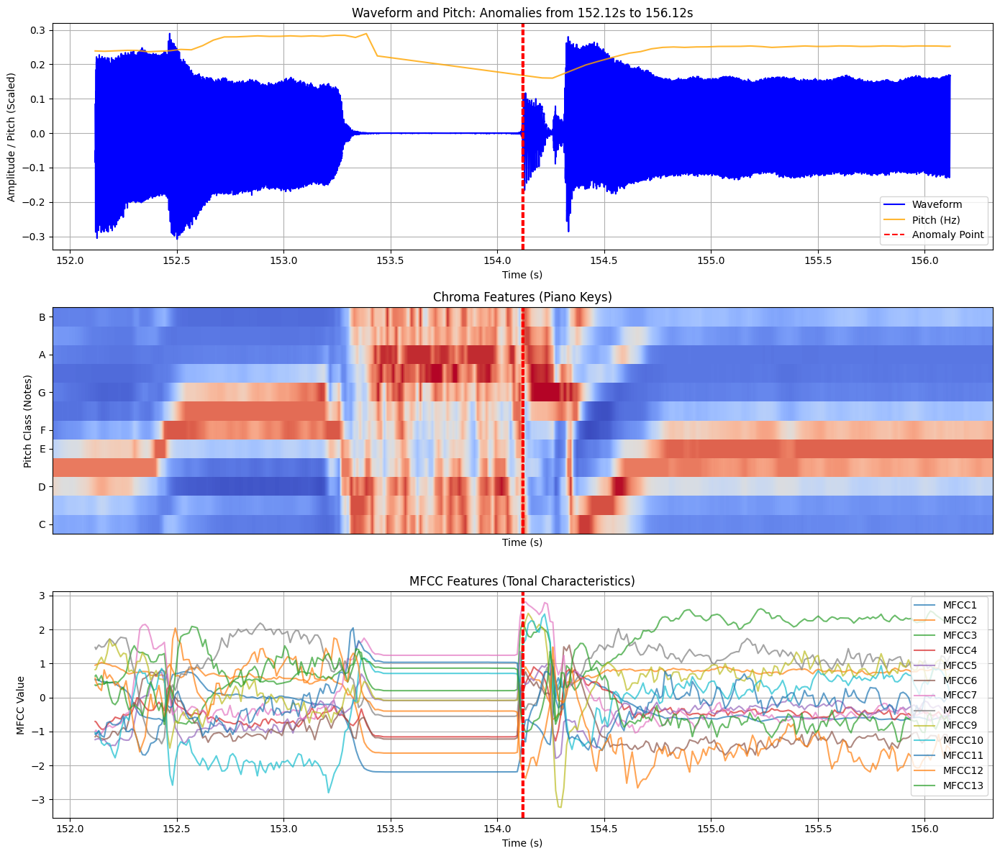

In [10]:
plot_waveform_with_all_anomalies(
    audio_df, 
    downsampled_df[downsampled_df['Anomaly']], 
    KNOWN_GLITCH
)

# Group anomalies
grouped_anomalies_isolation_forest = group_anomalies(downsampled_df, time_column='Time (s)', anomaly_column='Anomaly')
visualize_anomalies(signal, sr, audio_df, downsampled_df, grouped_anomalies_isolation_forest)

# Store results for Isolation Forest
isolation_forest_results = {
    "Total Anomalies": downsampled_df['Anomaly'].sum(),
    "Anomaly Times": downsampled_df.loc[downsampled_df['Anomaly'], 'Time (s)'].tolist(),
    "Grouped Anomalies": grouped_anomalies_isolation_forest,  # Ensure this key is set
    "Downsampled DataFrame": downsampled_df.copy()
}

# 5.2 Autoencoder

In [11]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras import backend as K
import numpy as np
import pandas as pd

# Clear session to avoid residual graphs
K.clear_session()

# Copy data to prevent mutation
data_copy = combined_features_df.copy()

# Ensure 'Anomaly' column exists in data_copy
if 'Anomaly' not in data_copy.columns:
    data_copy['Anomaly'] = False

# Aggressive downsampling for speed
downsample_factor = 10
features = data_copy.drop(['Time (s)', 'Anomaly'], axis=1, errors='ignore').values  # Ignore if 'Anomaly' doesn't exist
features = features[::downsample_factor]
time_downsampled = data_copy['Time (s)'][::downsample_factor]

# Standardize the features
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

# Define a lightweight Autoencoder
input_dim = scaled_features.shape[1]
autoencoder = Sequential([
    Dense(16, activation='relu', input_shape=(input_dim,)),
    Dense(8, activation='relu'),
    Dense(16, activation='relu'),
    Dense(input_dim, activation='sigmoid')
])

autoencoder.compile(optimizer='adam', loss='mse')

# Train the Autoencoder
history = autoencoder.fit(
    scaled_features, scaled_features,
    epochs=5,
    batch_size=1024,
    shuffle=True,
    verbose=1
)

# Compute reconstruction errors
reconstructed = autoencoder.predict(scaled_features)
reconstruction_errors = np.mean((scaled_features - reconstructed) ** 2, axis=1)

# Define anomaly threshold
threshold_percentile = 99.8  # Adjust sensitivity here
threshold = np.percentile(reconstruction_errors, threshold_percentile)
print(f"Anomaly detection threshold (at {threshold_percentile}th percentile): {threshold}")

# Add anomaly labels to the DataFrame
data_copy['Anomaly'] = False  # Ensure 'Anomaly' column exists
data_copy.loc[time_downsampled.index, 'Anomaly'] = reconstruction_errors > threshold

# Create the downsampled DataFrame for visualization
downsampled_df = pd.DataFrame(
    scaled_features, 
    columns=[col for col in data_copy.columns if col not in ['Time (s)', 'Anomaly']]  # Ensure consistent columns
)
downsampled_df['Time (s)'] = time_downsampled.values
downsampled_df['Anomaly'] = reconstruction_errors > threshold

# Count anomalies
total_anomalies = downsampled_df['Anomaly'].sum()
print(f"Total number of anomalies detected by Autoencoder: {total_anomalies}")


C:\Users\Mika\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5
641/641 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 0.9799
Epoch 2/5
641/641 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6596
Epoch 3/5
641/641 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6313
Epoch 4/5
641/641 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6235
Epoch 5/5
641/641 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6204
20505/20505 ━━━━━━━━━━━━━━━━━━━━ 23s 1ms/step
Anomaly detection threshold (at 99.8th percentile): 4.615453767978928
Total number of anomalies detected by Autoencoder: 1313


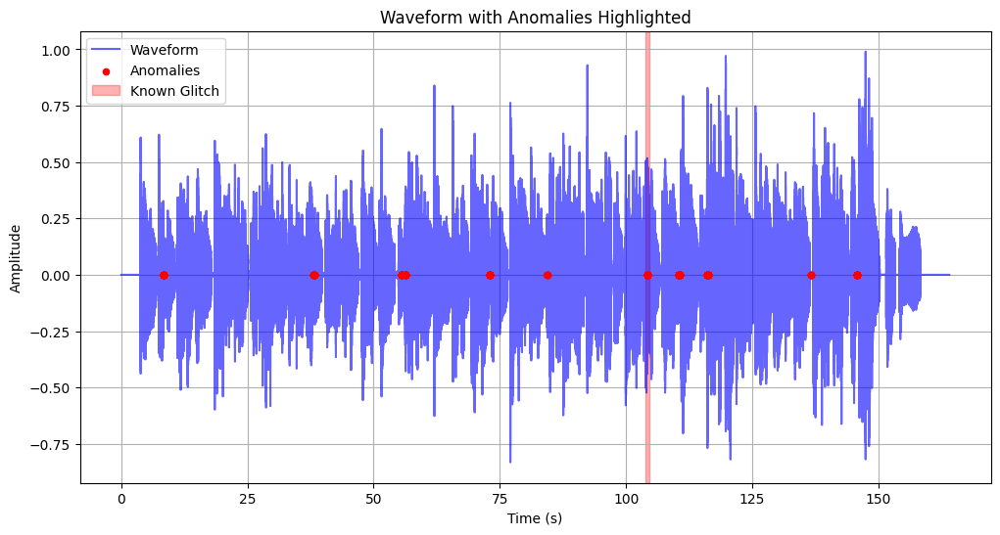

C:\Users\Mika\AppData\Roaming\Python\Python311\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


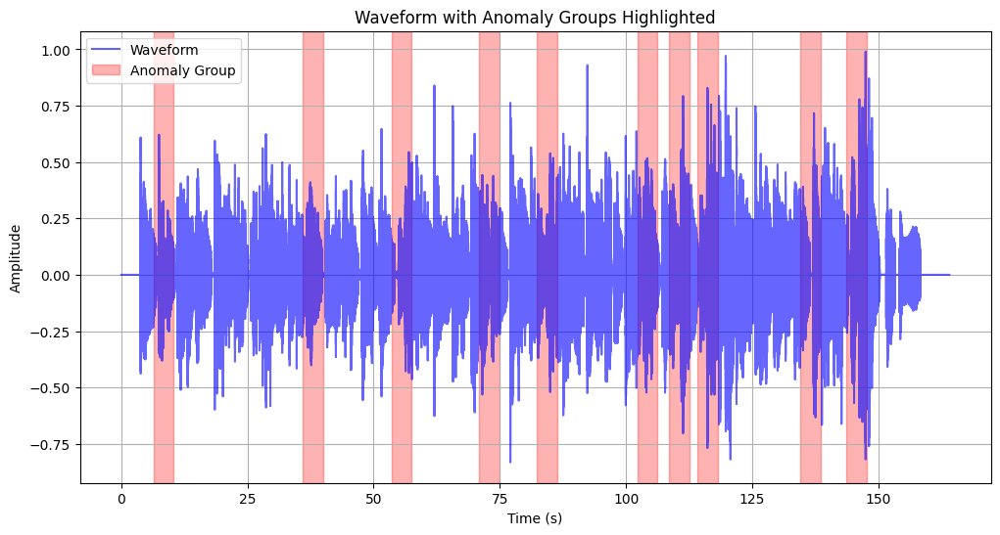

Visualizing anomaly group around 8.35s (from 6.35s to 10.35s)...


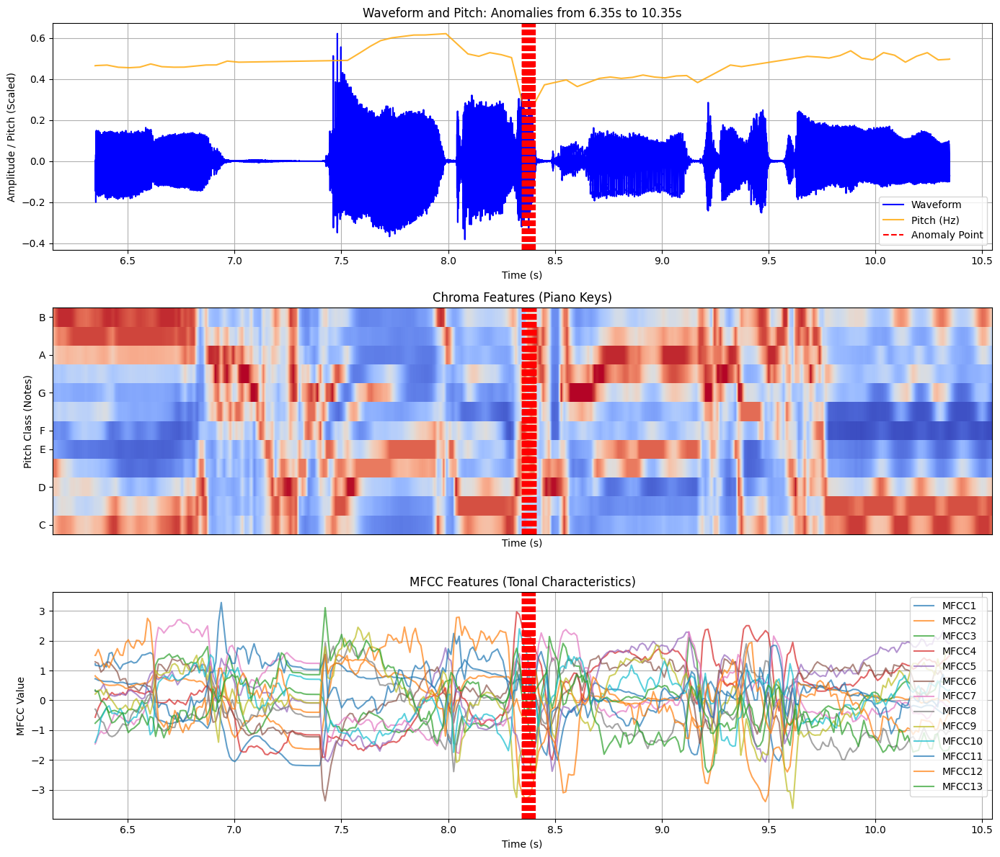

Visualizing anomaly group around 37.98s (from 35.98s to 39.98s)...


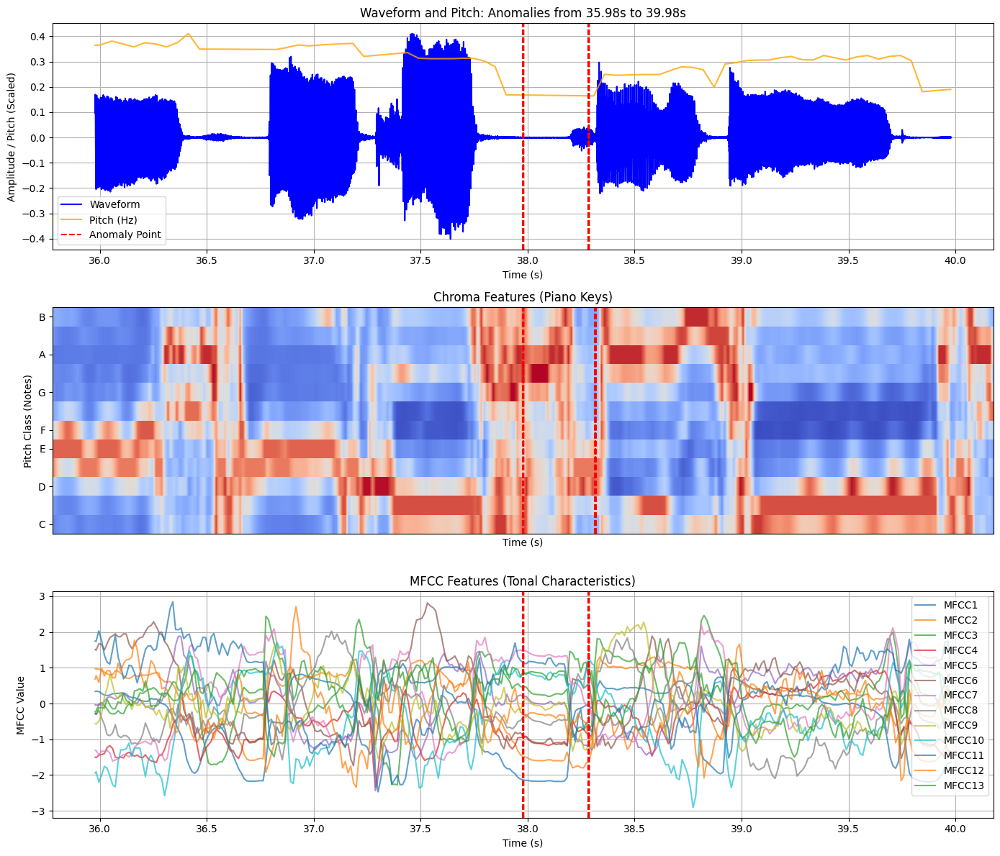

Visualizing anomaly group around 55.51s (from 53.51s to 57.51s)...


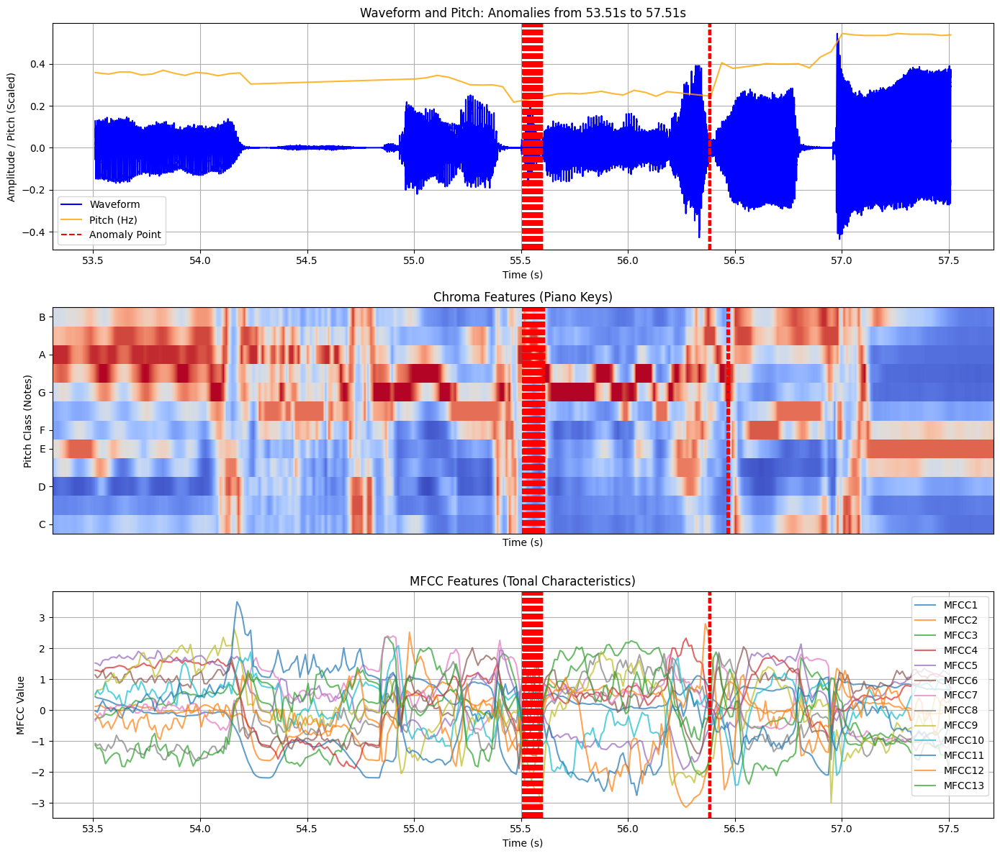

Visualizing anomaly group around 72.93s (from 70.93s to 74.93s)...


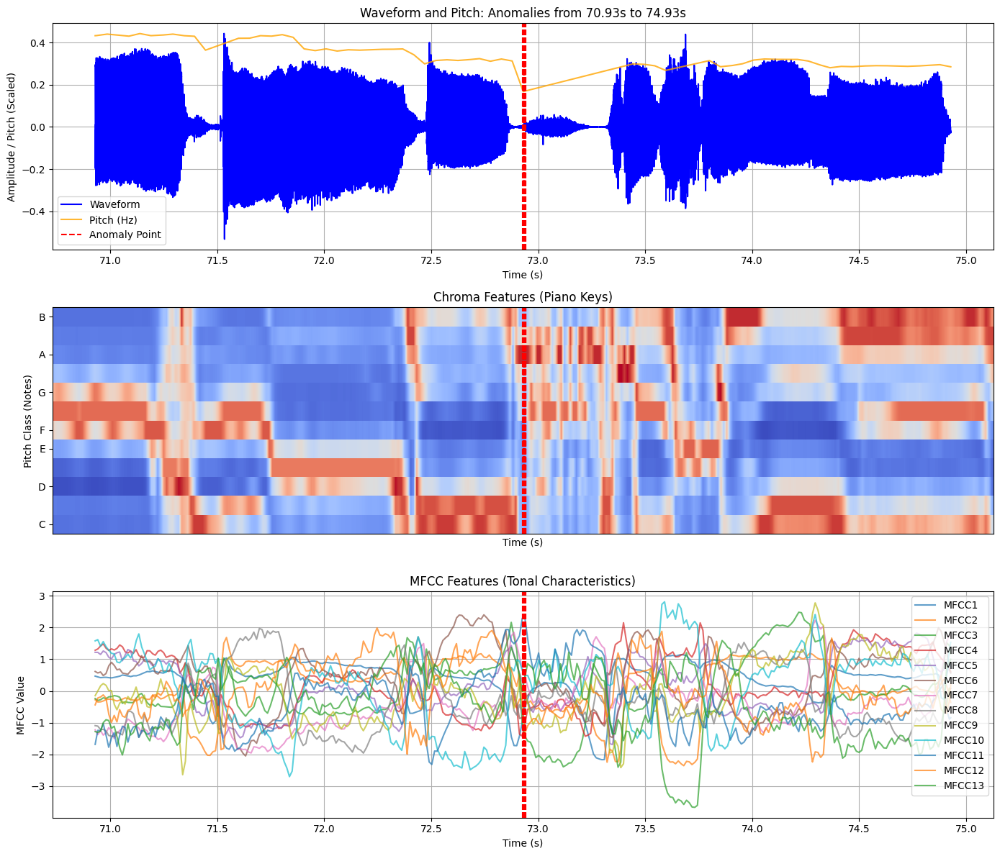

Visualizing anomaly group around 84.34s (from 82.34s to 86.34s)...


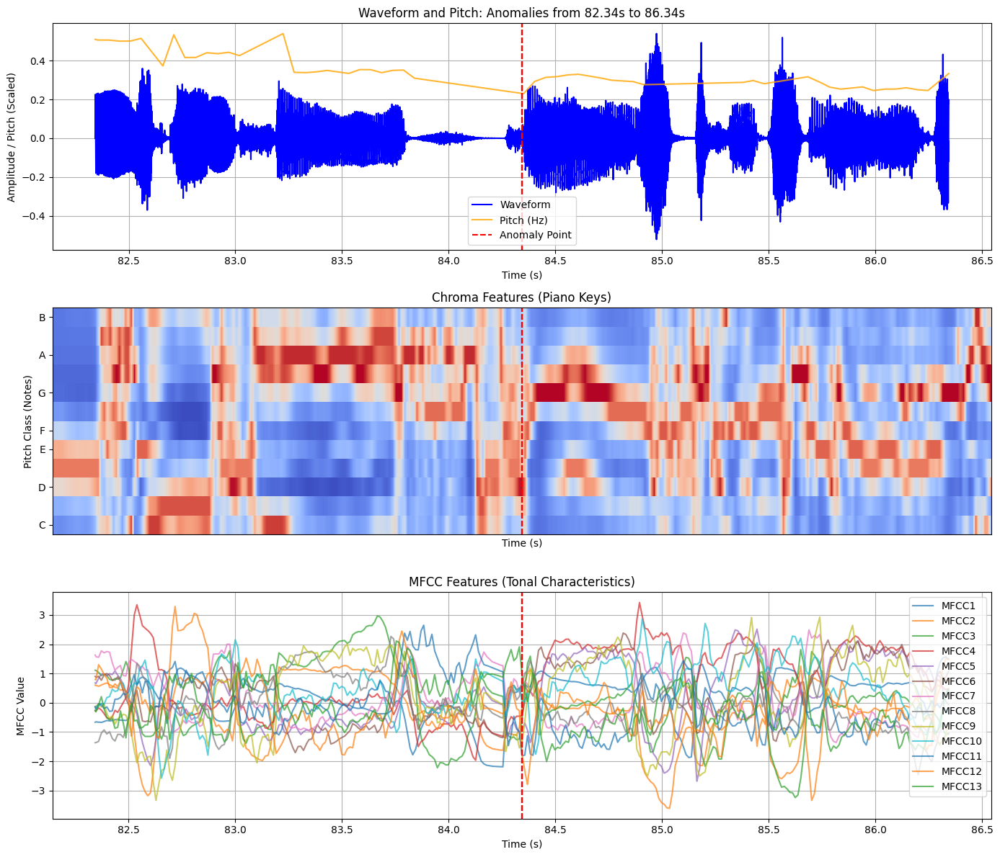

Visualizing anomaly group around 104.20s (from 102.20s to 106.20s)...


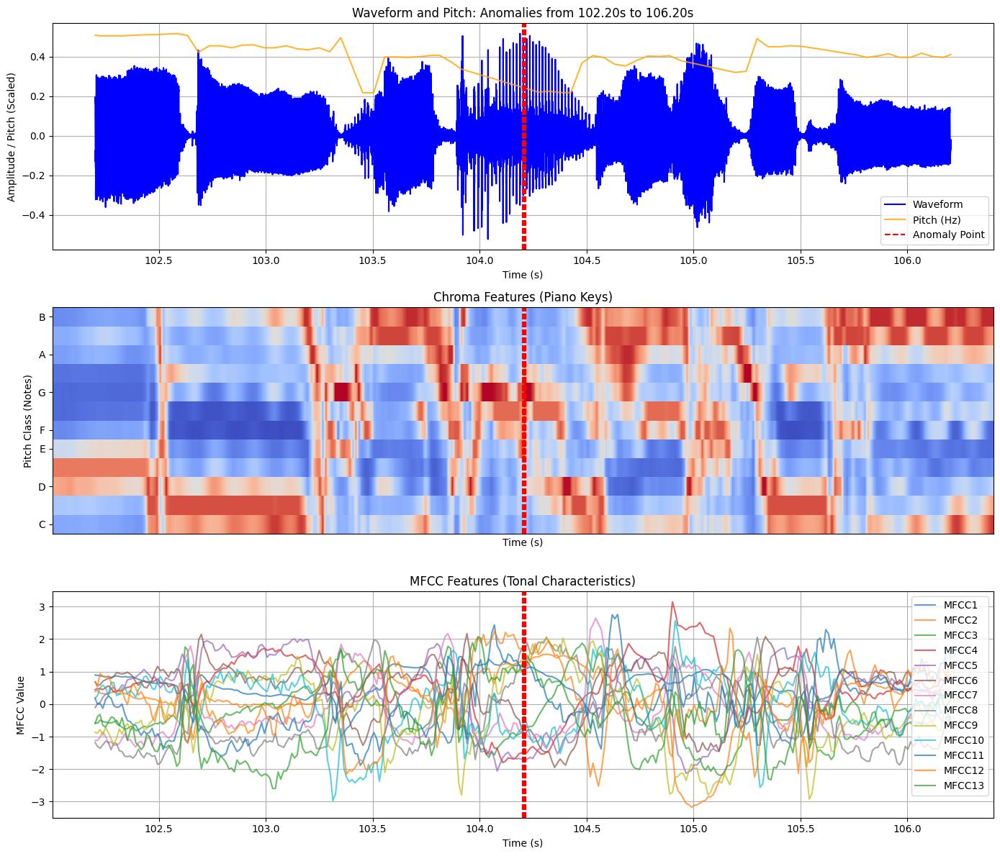

Visualizing anomaly group around 110.52s (from 108.52s to 112.52s)...


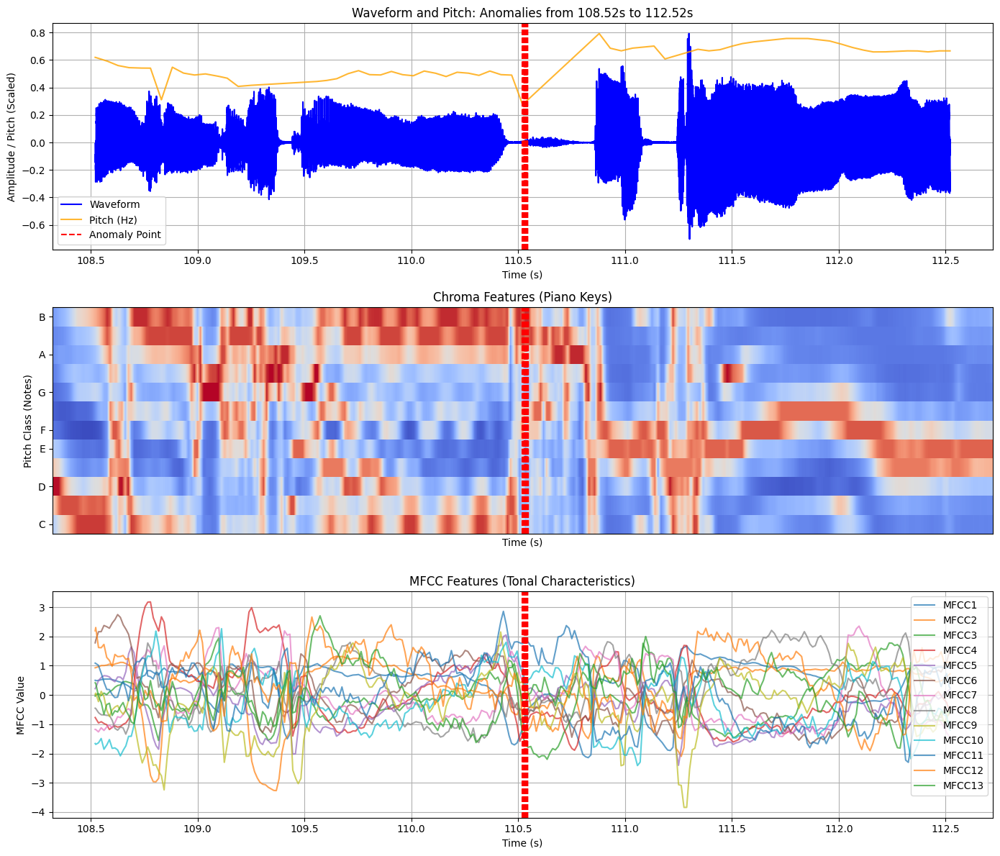

Visualizing anomaly group around 116.13s (from 114.13s to 118.13s)...


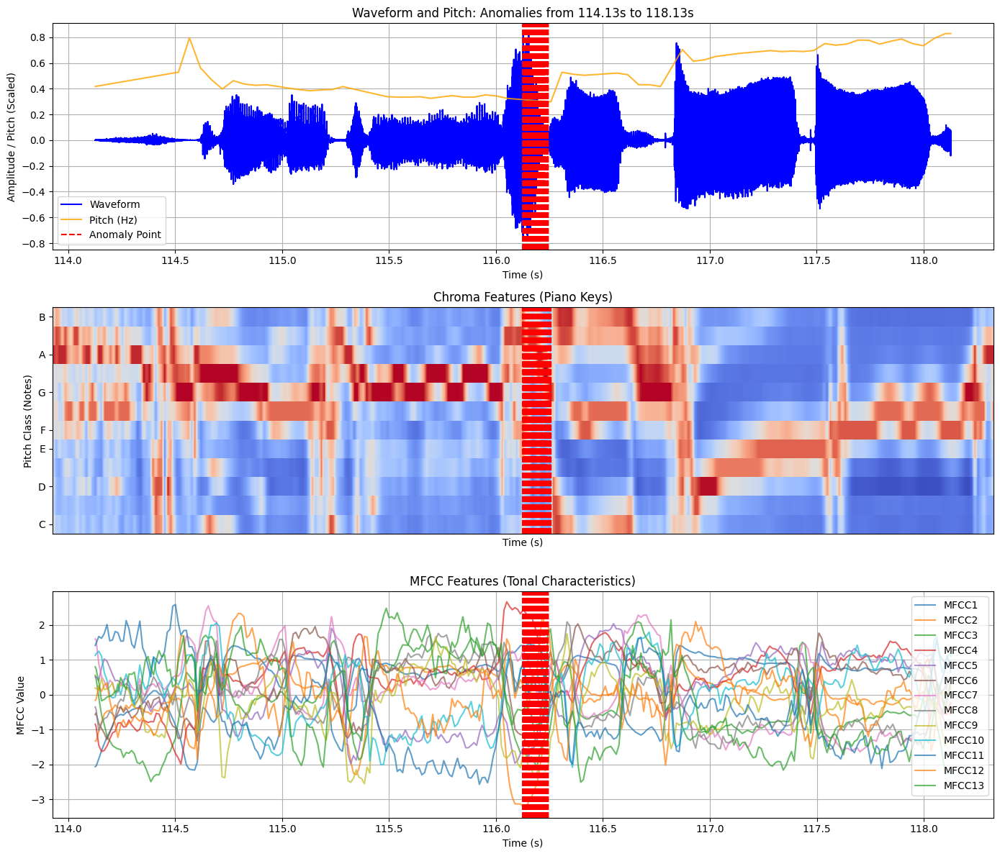

Visualizing anomaly group around 136.57s (from 134.57s to 138.57s)...


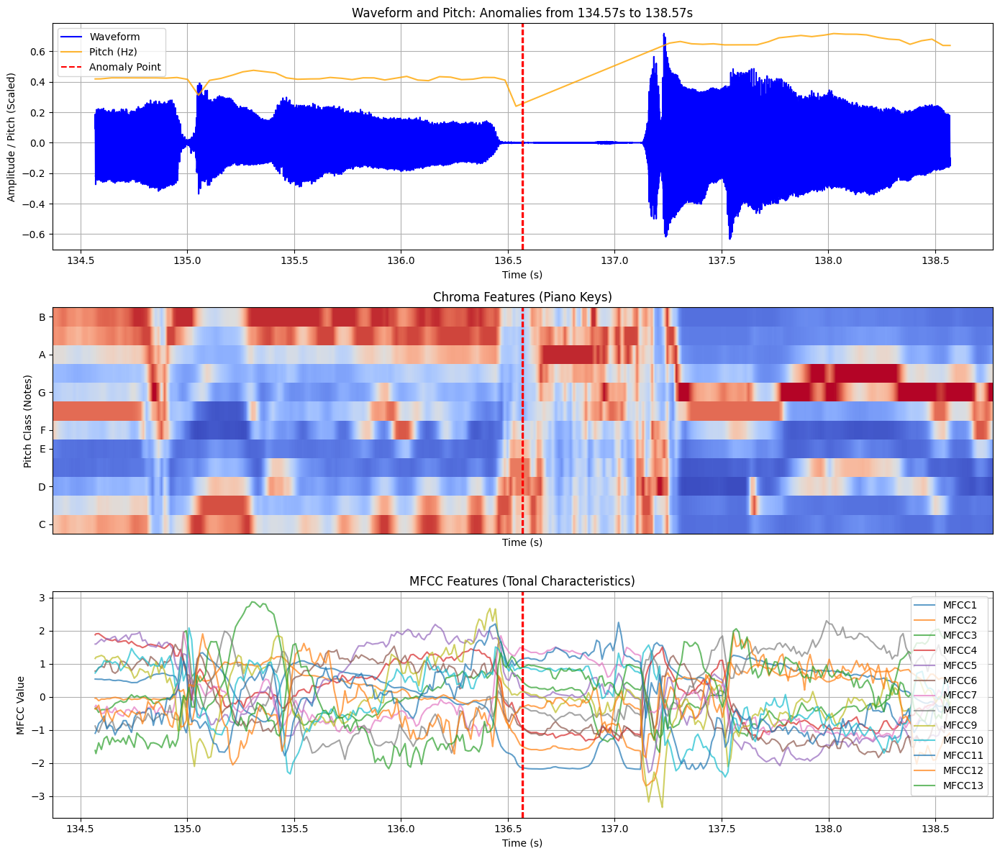

Visualizing anomaly group around 145.70s (from 143.70s to 147.70s)...


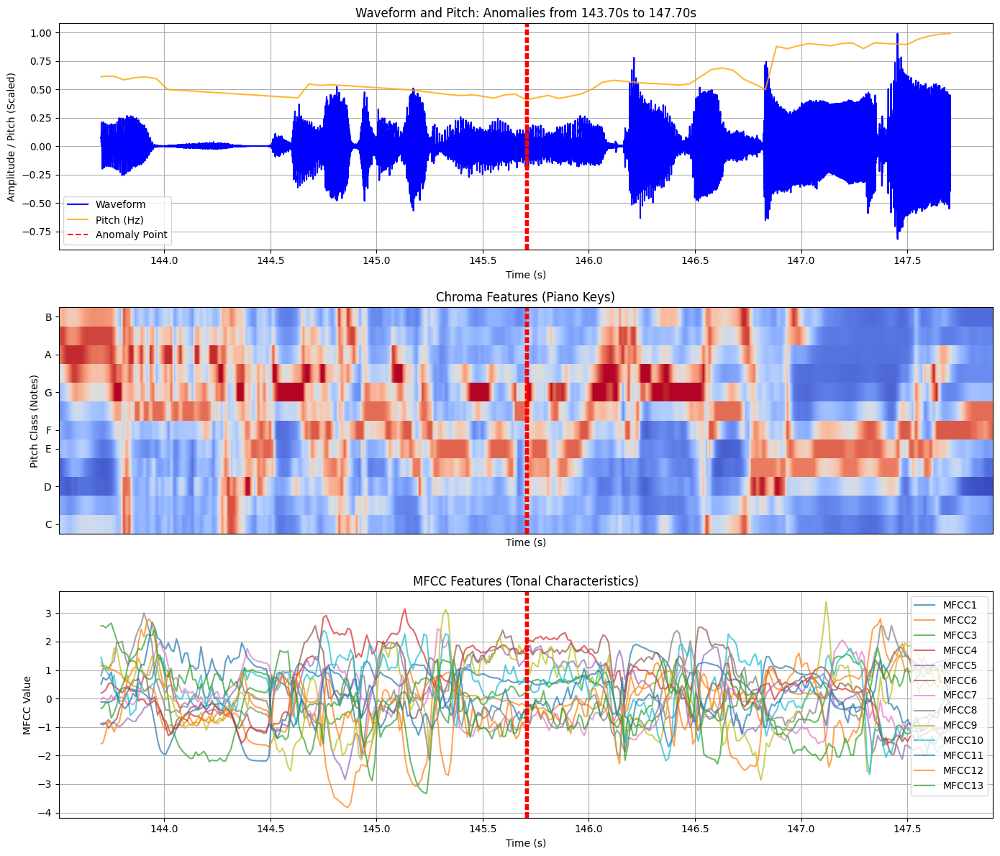

In [12]:
plot_waveform_with_all_anomalies(
    audio_df, 
    downsampled_df[downsampled_df['Anomaly']], 
    KNOWN_GLITCH
)

# Group anomalies
grouped_anomalies_autoencoder = group_anomalies(downsampled_df, time_column='Time (s)', anomaly_column='Anomaly')
visualize_anomalies(signal, sr, audio_df, downsampled_df, grouped_anomalies_autoencoder)

# Store results for Autoencoder
autoencoder_results = {
    "Total Anomalies": downsampled_df['Anomaly'].sum(),
    "Anomaly Times": downsampled_df.loc[downsampled_df['Anomaly'], 'Time (s)'].tolist(),
    "Grouped Anomalies": grouped_anomalies_autoencoder,  # Ensure this key is set
    "Downsampled DataFrame": downsampled_df.copy()
}


In [13]:
# Comparison of Anomaly Groups
from collections import defaultdict

# Helper function to compare groups
def compare_anomaly_groups(groups1, groups2, time_threshold=2):
    shared_groups = []
    unique_to_groups1 = []
    unique_to_groups2 = groups2.copy()

    for group1 in groups1:
        overlap_found = False
        for group2 in unique_to_groups2:
            if abs(group1 - group2) <= time_threshold:
                shared_groups.append((group1, group2))
                overlap_found = True
                unique_to_groups2.remove(group2)
                break
        if not overlap_found:
            unique_to_groups1.append(group1)

    return {
        "Shared Groups": shared_groups,
        "Unique to Algorithm 1": unique_to_groups1,
        "Unique to Algorithm 2": unique_to_groups2
    }

# Compare Isolation Forest and Autoencoder groups
group_comparison = compare_anomaly_groups(
    isolation_forest_results["Grouped Anomalies"],
    autoencoder_results["Grouped Anomalies"],
    time_threshold=2  # Example: 2-second overlap allowed
)

# Calculate metrics for anomaly group detection
iou = len(group_comparison["Shared Groups"]) / (
    len(group_comparison["Unique to Algorithm 1"]) +
    len(group_comparison["Unique to Algorithm 2"]) +
    len(group_comparison["Shared Groups"])
)

# Print results
print("### Anomaly Group Comparison ###")
print(f"Shared Groups: {len(group_comparison['Shared Groups'])}")
print(f"Unique to Isolation Forest: {len(group_comparison['Unique to Algorithm 1'])}")
print(f"Unique to Autoencoder: {len(group_comparison['Unique to Algorithm 2'])}")
print(f"Intersection Over Union (IoU): {iou:.4f}")

### Anomaly Group Comparison ###
Shared Groups: 5
Unique to Isolation Forest: 2
Unique to Autoencoder: 5
Intersection Over Union (IoU): 0.4167
